# Habitat time series modelling of fish off Peru

This script has an attempt to model a spatial and temporal dataset of fish distribution off Peru. The data has estimates of abundance measured during cruise transects off Peru. There are about 2 to 3 cruises per year and the environmental variables as well as latitude and longitude were recorded for every sample.

## Methods and results
The following script shows the code to analyse the data.

In [68]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier

from sklearn import metrics
from sklearn.model_selection import train_test_split

### Input and loading the data

In [2]:
plt.style.use('bmh')
y_cm = cm.flag

dataPath ="Spatial_dataset.xlsx"

myvar = "anc"
envars = ['shelf','dc', 'prof', 'sst', 'sss', 'chl', 'oxi', 'oxiP'] # Environmental variables
myvars = ['anc', 'sar', 'jur', 'cab', 'mun', 'sam', 'bag', 'fvo', 'pot', 'vin', 'mic','zoo', 'dem', 'mer', 'cam'] # Response variables
spNames = ['Anchovy', 'Sardine','Jack mackerel', 'Chub mackerel', 'Squat lobster', 'White anchovy', 'Cat fish', 'False flying fish', 'Humboldt squid', 'Lightfish', 'Lantern fish', 'Zooplankton', 'Demersals', 'Hake', 'Camotillo'] # Species names

predloc = [6,14]
splitSize = 0.1
timeCol = 5 # Column with the time in decimal years
tdiff = 0.05 # Maximum difference from the mean to group cruises by time
balanced = 0

axLims = [-90, -70, -20, 0] # Axis limits for the scatter plots [x1, x2, y1, y2]

In [3]:
# Import data
df = pd.read_excel(dataPath)

In [30]:
#| eval: false

print(df.describe())
print(df.columns)
print(df.columns[predloc[0]:predloc[1]])
print(df[myvar].shape)
df.time

                 lon            lat           year          month  \
count  307243.000000  307243.000000  307243.000000  307243.000000   
mean      -78.275164     -11.143259    2001.873790       6.695762   
std         2.757388       3.992157       6.827057       3.554773   
min       -86.200355     -18.521000    1983.000000       1.000000   
25%       -80.360923     -14.550000    1998.000000       3.000000   
50%       -78.580566     -11.018000    2002.000000       7.000000   
75%       -76.723000      -7.783050    2007.000000      10.000000   
max       -67.895845      -3.406702    2012.000000      12.000000   

                 day           time          shelf             dc  \
count  307243.000000  307243.000000  307243.000000  307243.000000   
mean       15.301091    2002.387619      41.372846      83.202813   
std         8.869016       6.826203      67.492104      62.160997   
min         1.000000    1983.774660    -106.834000       0.032000   
25%         8.000000    1998.9495

0         1983.77466
1         1983.77466
2         1983.77466
3         1983.77466
4         1983.77466
             ...    
307238    2012.27466
307239    2012.27466
307240    2012.27466
307241    2012.27466
307242    2012.27466
Name: time, Length: 307243, dtype: float64

In [31]:
#| eval: false

# Pick the response variable
exec("y0 = df."+myvar)
y0 = df[myvar]
# Pick the predictors
x0 = df.iloc[:,0:predloc[1]]#[:,predloc[0]:predloc[1]]
print(x0)
print(y0)

              lon        lat  year  month  day        time   shelf      dc  \
0      -71.883000 -18.333000  1983     10   10  1983.77466  80.045  87.929   
1      -71.867000 -18.304000  1983     10   10  1983.77466  76.501  84.342   
2      -71.851000 -18.276000  1983     10   10  1983.77466  73.048  80.847   
3      -71.563000 -18.301000  1983     10   10  1983.77466  58.327  68.787   
4      -71.543000 -18.273000  1983     10   10  1983.77466  54.590  65.034   
...           ...        ...   ...    ...  ...         ...     ...     ...   
307238 -70.489700 -18.299517  2012      4   10  2012.27466 -10.283   1.387   
307239 -70.485767 -18.310383  2012      4   10  2012.27466 -10.134   2.146   
307240 -70.472350 -18.323083  2012      4   10  2012.27466 -10.959   2.356   
307241 -70.472251 -18.333150  2012      4   10  2012.27466 -10.718   3.130   
307242 -70.461083 -18.330367  2012      4   10  2012.27466 -11.932   2.095   

               prof  sst  sss  chl  oxi  oxiP  
0       2805.17

In [32]:
#| eval: false

# Remove nan's
x0["var"] = y0
xnan = x0.dropna()
#print(xnan.shape)
print(xnan)
#xnan = xnan.drop("prof", axis = 1)

              lon        lat  year  month  day        time   shelf      dc  \
6189   -71.500000 -18.300000  1985      3   24  1985.22968  54.180  64.411   
6190   -71.400000 -18.200000  1985      3   24  1985.22968  39.096  49.091   
6191   -71.400000 -18.200000  1985      3   24  1985.22968  39.096  49.091   
6192   -71.400000 -18.200000  1985      3   24  1985.22968  39.096  49.091   
6193   -71.400000 -18.100000  1985      3   24  1985.22968  30.189  40.592   
...           ...        ...   ...    ...  ...         ...     ...     ...   
257544 -74.376772 -15.930525  2008     12   22  2008.97420   8.326   9.102   
257545 -74.368263 -15.915570  2008     12   22  2008.97420   6.633   7.229   
257546 -74.362757 -15.878010  2008     12   22  2008.97420   2.493   3.142   
257547 -74.359454 -15.900821  2008     12   22  2008.97420   4.881   5.385   
257548 -74.350500 -15.886077  2008     12   22  2008.97420   3.087   3.554   

               prof        sst        sss       chl        oxi 

In [33]:
#| eval: false

# Remove repetated rows in X
# Check for duplicated values
##df.duplicated()
##df2 = df.pivot_table(index = ['time', 'shelf'], aggfunc ='size')
##print(df2)
##df3 = df.drop_duplicates(subset = ['shelf',
##       'dc', 'prof', 'sst', 'sss', 'chl', 'oxi', 'oxiP'])
##print(df.shape)
##print(df3.shape)

xnanUnique = xnan.drop_duplicates(subset = envars)

# Separate predictor and response variable again
xx = xnanUnique.drop("var", axis = 1)
yy = xnanUnique["var"]

xx = np.array(xx)

In [34]:
#| eval: false

# Scale?
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
scaler = MinMaxScaler()
#scaler = StandardScaler()
scaler.fit(xx[:,predloc[0]:predloc[1]])
scaled = scaler.transform(xx[:,predloc[0]:predloc[1]])
xx[:,predloc[0]:predloc[1]]=scaled

(221055,)
(221055, 15)
              lon        lat  year  month  day        time   shelf      dc  \
6189   -71.500000 -18.300000  1985      3   24  1985.22968  54.180  64.411   
6190   -71.400000 -18.200000  1985      3   24  1985.22968  39.096  49.091   
6191   -71.400000 -18.200000  1985      3   24  1985.22968  39.096  49.091   
6192   -71.400000 -18.200000  1985      3   24  1985.22968  39.096  49.091   
6193   -71.400000 -18.100000  1985      3   24  1985.22968  30.189  40.592   
...           ...        ...   ...    ...  ...         ...     ...     ...   
257544 -74.376772 -15.930525  2008     12   22  2008.97420   8.326   9.102   
257545 -74.368263 -15.915570  2008     12   22  2008.97420   6.633   7.229   
257546 -74.362757 -15.878010  2008     12   22  2008.97420   2.493   3.142   
257547 -74.359454 -15.900821  2008     12   22  2008.97420   4.881   5.385   
257548 -74.350500 -15.886077  2008     12   22  2008.97420   3.087   3.554   

               prof        sst        ss

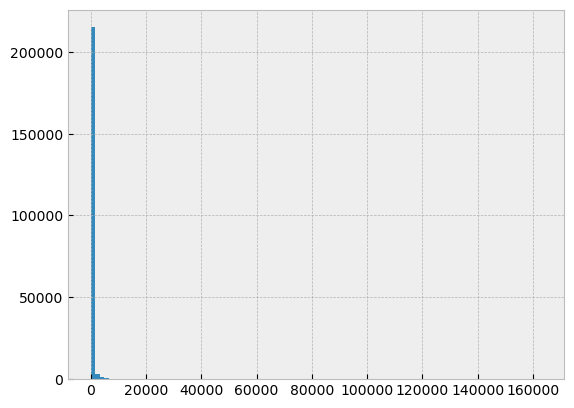

In [35]:
#| eval: false

# Check print(xx.shape)
print(yy.shape)
print(xnanUnique.shape)
print(xnan)
print(x0)
print(xnanUnique.shape)
print(xx.shape)
print(yy.shape)
print(yy.max())
print(yy.min())
yy.hist(bins=100)
plt.show()

/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_53293/2323190365.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_53293/2323190365.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1


1.0


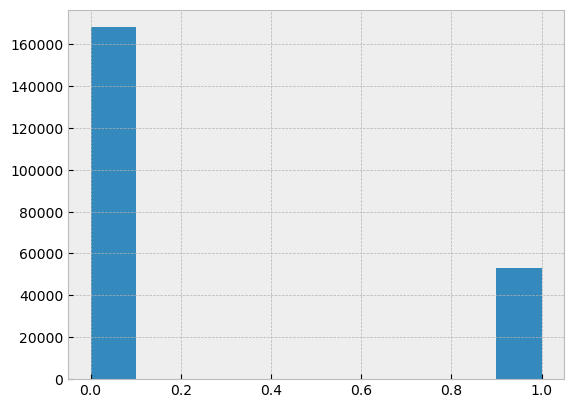

In [36]:
#| eval: false

# Change all y values to 1 to get a presence-absence model
yy[yy>0] = 1
print(yy.max())
plt.hist(yy)
plt.show()

In [38]:
#| eval: false

# Change the time column to a constant time per cruise (here's we'll guess the number of cruises and the time intervals)
xx[:,timeCol] # That's the time column

# First group by times where the difference between every single time and their average is not greater than tidff
xt = np.array(xx[:,timeCol])
mask = np.abs(xt[:-1] - xt[1:]) <= tdiff
xtime = np.split(xt, np.where(~mask)[0] + 1)

# Now get the averages
xav = []
for i in range(0,len(xtime)):
    xav.append(xtime[i].mean())

# Now substitute the time column values
for i in range(0,len(xav)):
    for j in np.unique(xtime[i][:]):
        xt[xt==j] = xav[i]
xx[:,timeCol] = xt

#### Splitting the data

In [ ]:
#| eval: false

# Split train and test datasets
x_train, x_test, y_train, y_test = train_test_split(xx,yy, test_size = splitSize)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

In [40]:
#| eval: false

xx[0,:]

array([-7.15000000e+01, -1.83000000e+01,  1.98500000e+03,  3.00000000e+00,
        2.40000000e+01,  1.98529204e+03,  2.53266619e-01,  1.19203531e-01,
        3.08220216e-01,  6.63767582e-01,  8.15457694e-01,  4.94170049e-03,
        1.72367995e-01,  2.71570603e-01])

In [ ]:
#| eval: false

from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import matplotlib.pyplot as plt

seed = 42

plt.style.use('ggplot')

models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('RF', RandomForestClassifier()))

results = []
names = []
scoring = 'accuracy'
for name, model in models:
     kfold = model_selection.KFold(n_splits=10, random_state=seed, shuffle=True)
     cv_results = model_selection.cross_val_score(model, x_train, y_train, cv=kfold, scoring=scoring)
     results.append(cv_results)
     names.append(name)
     msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
     print(msg)

In [ ]:
#| eval: false

# Initialise
rf1 = RandomForestClassifier(n_estimators = 100, random_state = 0)
rf2 = RandomForestClassifier(n_estimators = 1000, random_state = 0)

# Fit
rf1.fit(x_train,y_train)
rf2.fit(x_train,y_train)

In [ ]:
#| eval: false

# Predict values
rf1_pred = rf1.predict(x_test)
rf2_pred = rf2.predict(x_test)

rf1_r2 = metrics.r2_score(y_test, rf1_pred)
rf2_r2 = metrics.r2_score(y_test, rf2_pred)
rf1_acc = metrics.accuracy_score(y_test, rf1_pred)
rf2_acc = metrics.accuracy_score(y_test, rf2_pred)
print(rf1_r2)
print(rf2_r2)
print(rf1_acc)
print(rf2_acc)

In [ ]:
import xgboost

In [ ]:
#| eval: false

# Init classifier
xgb1 = xgboost.XGBClassifier(n_estimators=100)
xgb2 = xgboost.XGBClassifier(n_estimators=1000)

# Fit
xgb1.fit(x_train, y_train)
xgb2.fit(x_train, y_train)

In [ ]:
#| eval: false

# Predict
xgb1_pred = xgb1.predict(x_test)
xgb2_pred = xgb2.predict(x_test)

xgb1_r2 = metrics.r2_score(y_test, xgb1_pred)
xgb2_r2 = metrics.r2_score(y_test, xgb2_pred)
xgb1_acc = metrics.accuracy_score(y_test, xgb1_pred)
xgb2_acc = metrics.accuracy_score(y_test, xgb2_pred)
print(xgb1_r2)
print(xgb2_r2)
print(xgb1_acc)
print(xgb2_acc)

In [117]:
# A stupid way to guess where to cut the data
# But it works hehe
print(xx.shape)
print(xx[:,2])
print(xx[20000,5])
print(xx[90000,5])
print(xx[53500,5]) # Split here to be able to predict El Niño
print(xx[157000,5]) # And here to get more train values
print(xx[220000,5])
print(yy.shape)

(221055, 14)
[1985. 1985. 1985. ... 2008. 2008. 2008.]
1991.5031103414306
2000.819575773256
1998.275430178117
2004.166192630553
2008.9161880570934
(221055,)


In [97]:
splitSpot = 157000 #53500
xTrain = xx[0:splitSpot,:]
xTest = xx[splitSpot:-1,:]
yTrain = yy[0:splitSpot]
yTest = yy[splitSpot:-1]

print(xTrain)
print(xTest)
print(yTrain)
print(yTest)

[[-7.15000000e+01 -1.83000000e+01  1.98500000e+03 ...  4.94170049e-03
   1.72367995e-01  2.71570603e-01]
 [-7.14000000e+01 -1.82000000e+01  1.98500000e+03 ...  7.36686918e-03
   1.68806362e-01  2.04456742e-01]
 [-7.14000000e+01 -1.81000000e+01  1.98500000e+03 ...  8.80351965e-03
   1.67912647e-01  1.74594481e-01]
 ...
 [-8.15716087e+01 -6.23483333e+00  2.00400000e+03 ...  4.12462018e-03
   2.42098649e-01  1.11069355e-01]
 [-8.15689650e+01 -6.00066667e+00  2.00400000e+03 ...  6.21585034e-03
   2.43964648e-01  1.06897449e-01]
 [-8.15676369e+01 -5.48195656e+00  2.00400000e+03 ...  1.05024974e-02
   2.58504034e-01  8.92276152e-02]]
[[-8.15567342e+01 -6.22766667e+00  2.00400000e+03 ...  4.12462018e-03
   2.42098649e-01  1.11069355e-01]
 [-8.15551887e+01 -5.83296667e+00  2.00400000e+03 ...  7.90156843e-03
   2.47293987e-01  1.00141889e-01]
 [-8.15520900e+01 -6.00150000e+00  2.00400000e+03 ...  6.21585034e-03
   2.43964648e-01  1.06897449e-01]
 ...
 [-7.43682626e+01 -1.59155704e+01  2.0080000

In [106]:
# Initialise
rf_timeseries = RandomForestClassifier(n_estimators = 100, random_state = 0)

# Fit
rf_timeseries.fit(xTrain,yTrain)

RandomForestClassifier(random_state=0)

In [107]:
# Predict values
yPred = rf_timeseries.predict(xTest)
rf_timeseries_acc = metrics.accuracy_score(yTest, yPred)
print(rf_timeseries_acc)

0.7499297467761576


In [108]:
cM,cTP,cTN,cDP,cDN,cFP,cFN = conMatrix(yTest, yPred)
prec = precision(cTP, cFP)
rec = recall(cTP, cFN)

print("Confusion matrix: ", cM)
print("Precision: ", prec)
print("Recall: ", rec)

Confusion matrix:                      True negative  True positive
Predited negative           43027          12755
Predicted positive           3263           5009
Precision:  0.8448185666048414
Recall:  0.5820636324912349


In [131]:
def timeSplitting(yy, xx, fold):
    
    xxChunks = list()
    yyChunks = list()
    chunk = yy.shape[0]/fold
    chunkIndeces = []
    
    for i in range(0,fold):
        chunkIndeces.append(int(i*chunk))
    chunkIndeces.append(yy.shape[0])
    
    for i in range(0,fold):
        print(i)
        print(chunkIndeces)
        print(chunkIndeces[i])
        print(chunkIndeces[i+1])
        xxChunks.append(xx[chunkIndeces[i]:chunkIndeces[i+1],:])
        yyChunks.append(yy[chunkIndeces[i]:chunkIndeces[i+1]])
    
    return xxChunks, yyChunks, chunkIndeces

In [132]:
xxChunks5, yyChunks5, chunkIndeces5 = timeSplitting(yy, xx, 5)
xxChunks10, yyChunks10, chunkIndeces10 = timeSplitting(yy, xx, 10)

0
[0, 44211, 88422, 132633, 176844, 221055]
0
44211
1
[0, 44211, 88422, 132633, 176844, 221055]
44211
88422
2
[0, 44211, 88422, 132633, 176844, 221055]
88422
132633
3
[0, 44211, 88422, 132633, 176844, 221055]
132633
176844
4
[0, 44211, 88422, 132633, 176844, 221055]
176844
221055
0
[0, 22105, 44211, 66316, 88422, 110527, 132633, 154738, 176844, 198949, 221055]
0
22105
1
[0, 22105, 44211, 66316, 88422, 110527, 132633, 154738, 176844, 198949, 221055]
22105
44211
2
[0, 22105, 44211, 66316, 88422, 110527, 132633, 154738, 176844, 198949, 221055]
44211
66316
3
[0, 22105, 44211, 66316, 88422, 110527, 132633, 154738, 176844, 198949, 221055]
66316
88422
4
[0, 22105, 44211, 66316, 88422, 110527, 132633, 154738, 176844, 198949, 221055]
88422
110527
5
[0, 22105, 44211, 66316, 88422, 110527, 132633, 154738, 176844, 198949, 221055]
110527
132633
6
[0, 22105, 44211, 66316, 88422, 110527, 132633, 154738, 176844, 198949, 221055]
132633
154738
7
[0, 22105, 44211, 66316, 88422, 110527, 132633, 154738, 17

### Data exploration

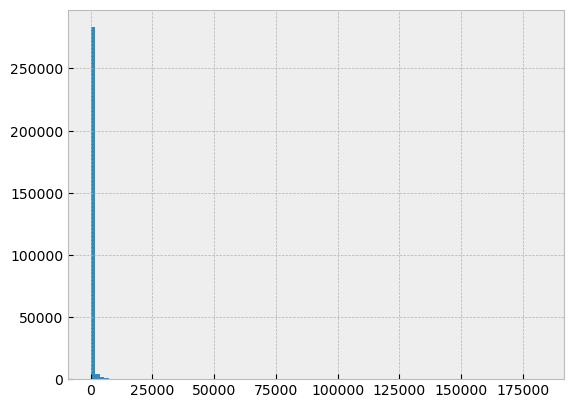

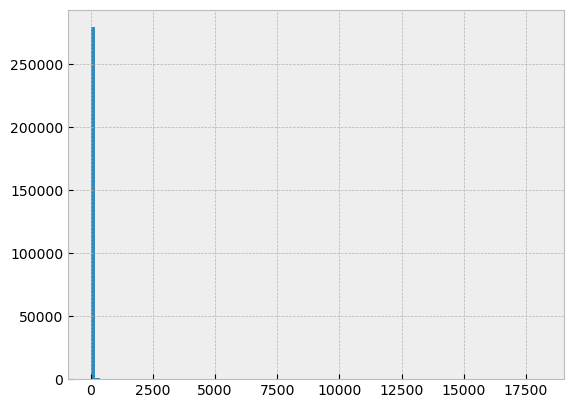

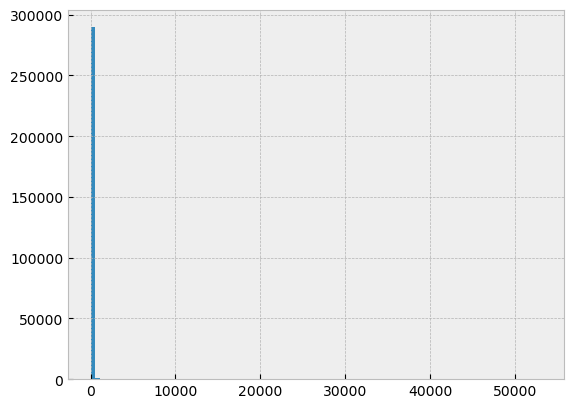

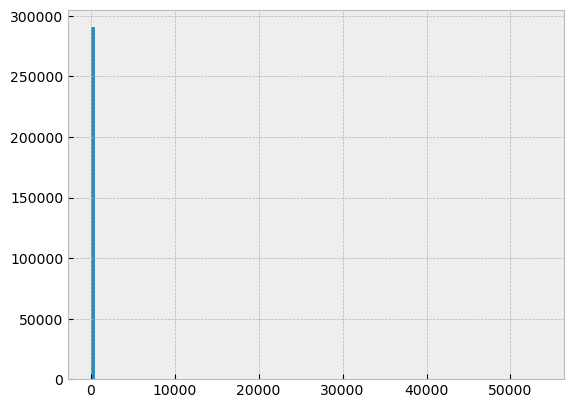

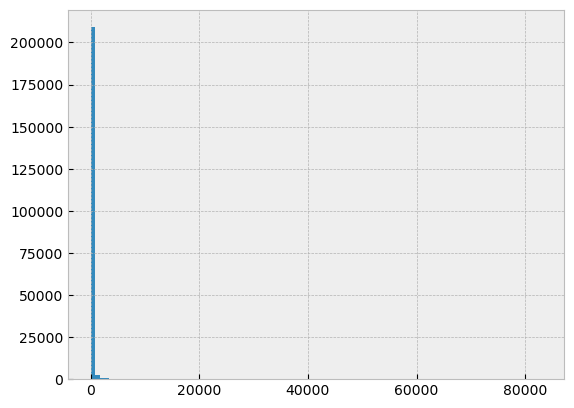

...

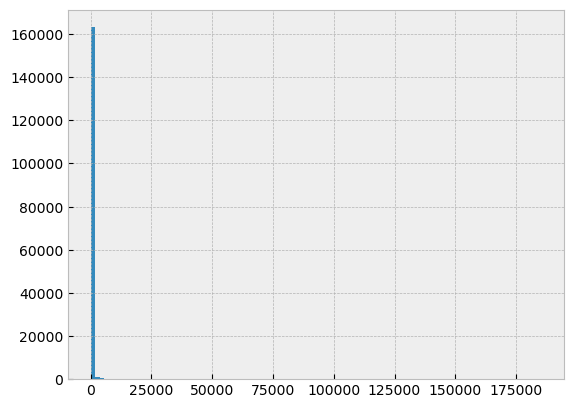

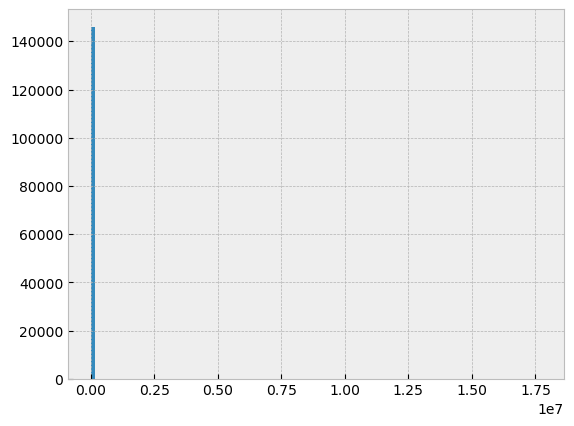

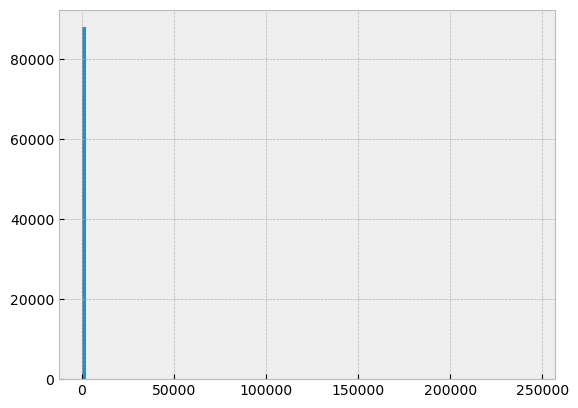

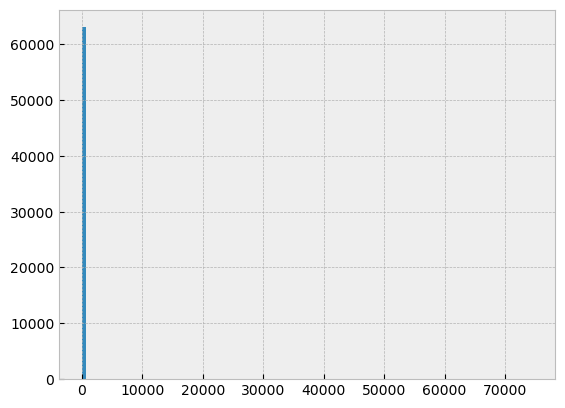

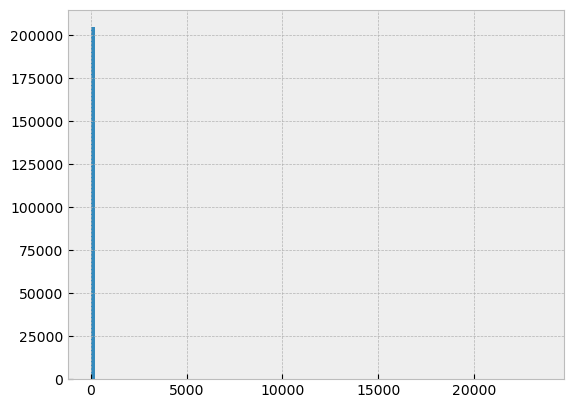

In [20]:
for i in myvars:
    plt.hist(df[i], bins=100)
    plt.show()

The data has outliers and most of the values are zeros. For the following analysis, I'll check only the anchovies.
First I'll remove the 0's to try to see the other values.

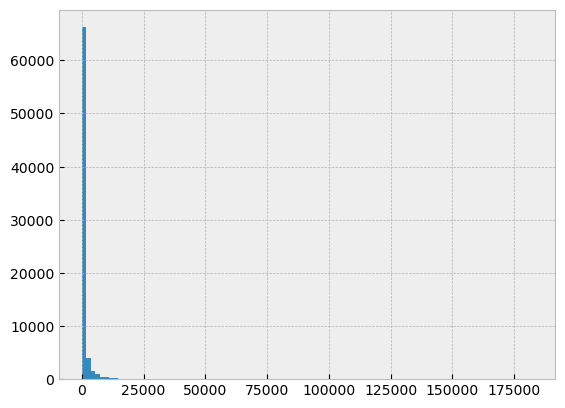

In [24]:
# Mask 0's
newvar = df[myvar].mask(df[myvar] == 0)
plt.hist(newvar,bins=100)
plt.show()

Here we can see a Poisson distribution with lot's of values close to zero and then very high outliers. In the next step I'll remove the outliers.

Isolate values within the 95% interval (excluding 0's) to remove outliers.

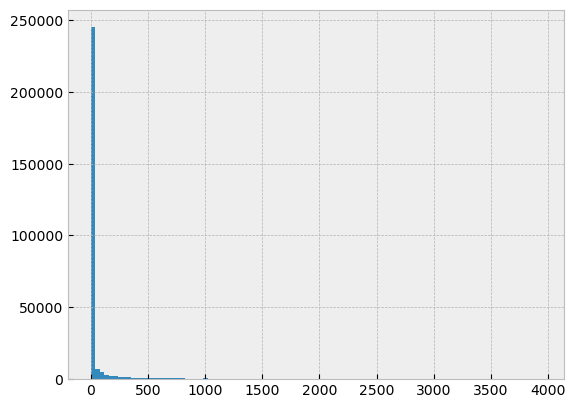

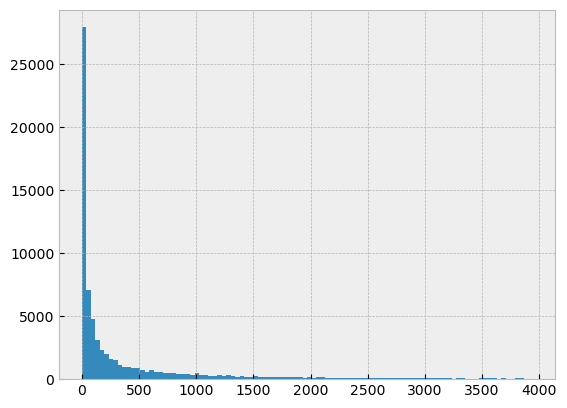

In [25]:
q95 = newvar.quantile(q=0.95)
var95 = df[myvar].mask(df[myvar] > q95)
var95No0 = var95.mask(var95  == 0) # Masks the 0's just for plotting
plt.hist(var95,bins=100)
plt.show()
plt.hist(var95No0, bins = 100)
plt.show()

Plot a simple timeseries.
I don't want connections between cruises so I'll use a scatter plot.

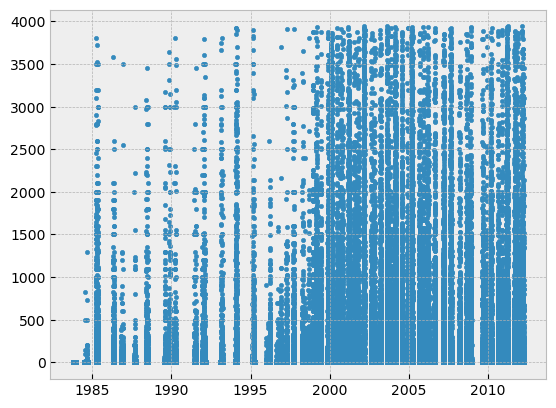

In [27]:
plt.scatter(df.time, var95, marker=".")
plt.show()

Get some smaller interval to search for a seasonallity

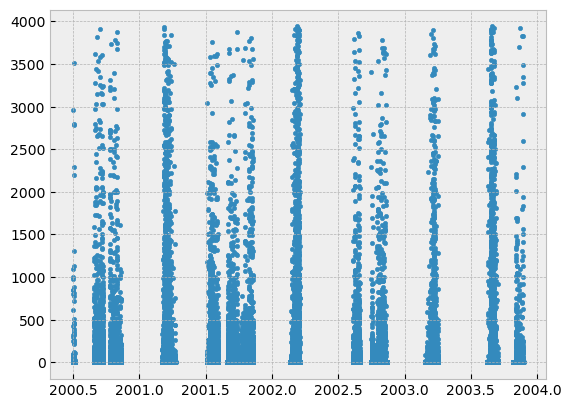

In [29]:
inter = [100000,170000]
plt.scatter(df.time[inter[0]:inter[1]], var95[inter[0]:inter[1]], marker=".")
plt.show()

Average over each season to get only semestral time-steps.

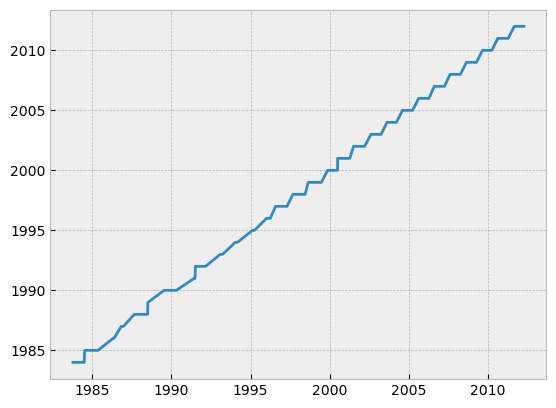

<function matplotlib.pyplot.show(close=None, block=None)>

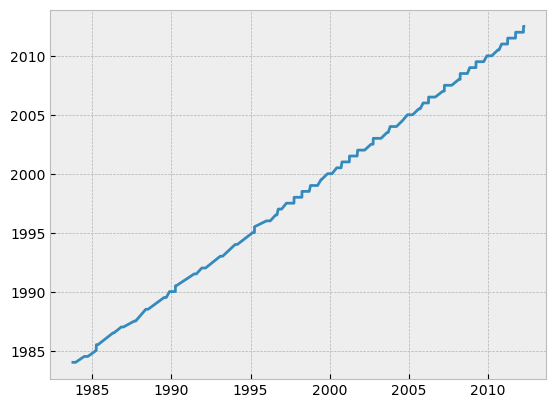

In [30]:
avTime = np.round(df.time, 0)

plt.plot(df.time,avTime)
plt.show()

for i in range(0,len(avTime)):
    
    if np.abs((df.time[i] - avTime[i])) < 0.25:
        avTime[i] = avTime[i]
        
    else:
        if (df.time[i] - avTime[i]) < 0:
            avTime[i] = avTime[i] - 0.5
        else:
            avTime[i] = avTime[i] + 0.5

plt.plot(df.time,avTime)
plt.show

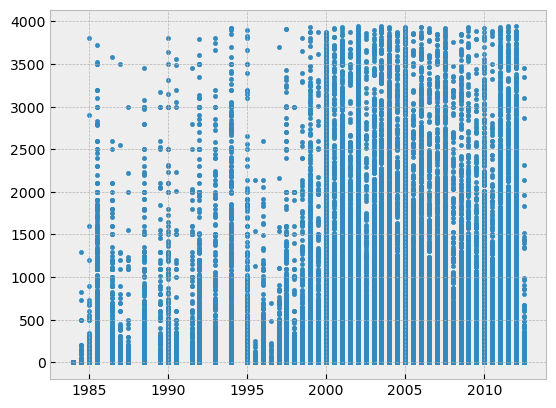

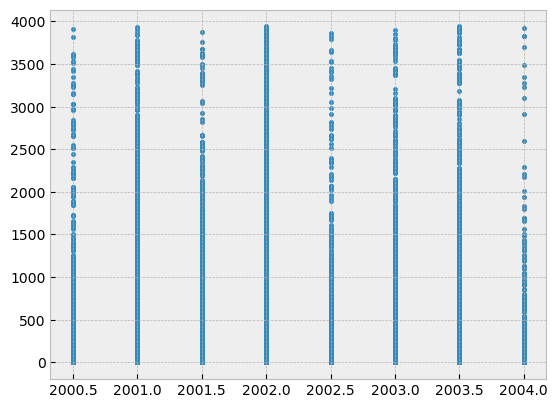

In [31]:
plt.scatter(avTime, var95, marker=".")
plt.show()

plt.scatter(avTime[inter[0]:inter[1]], var95[inter[0]:inter[1]], marker=".")
plt.show()

Check for correlations between environmental and response variables

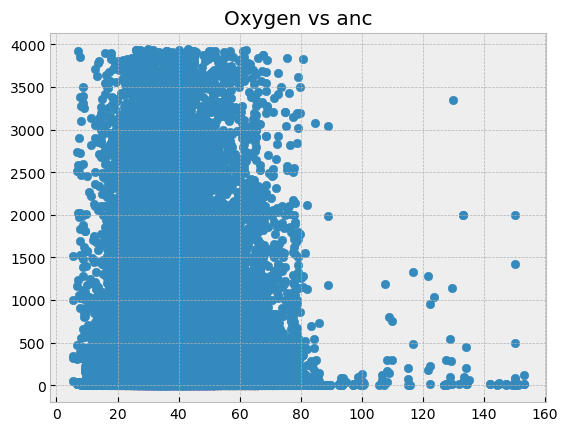

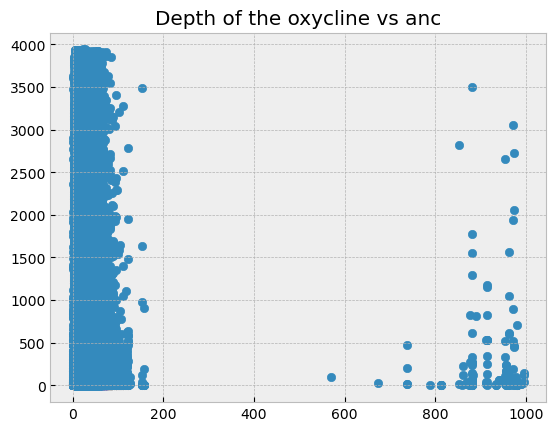

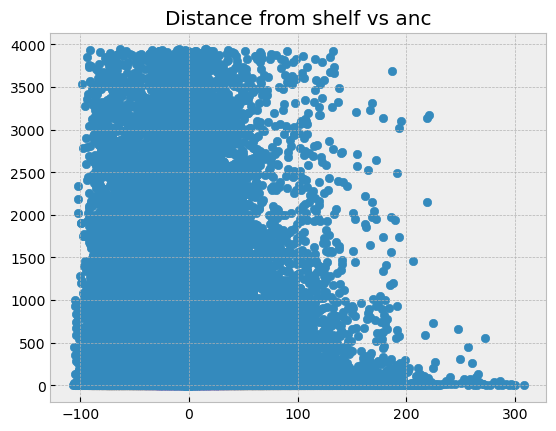

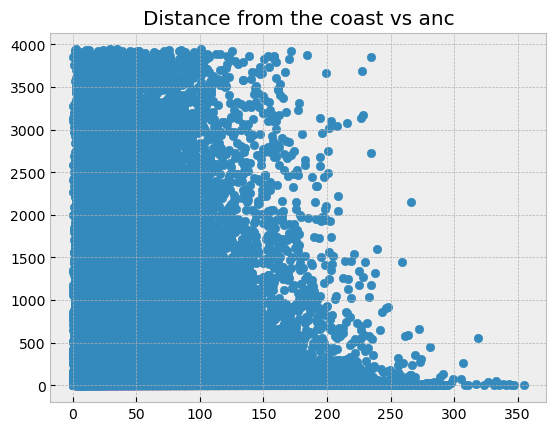

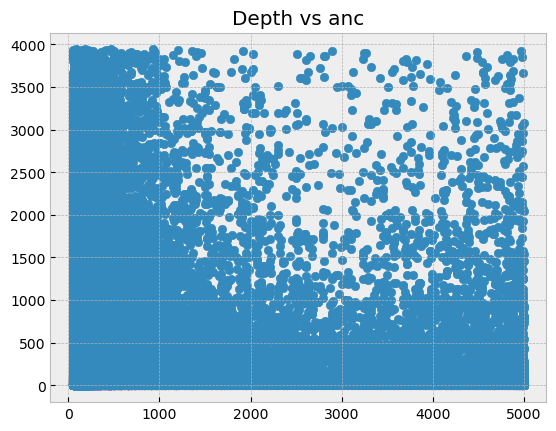

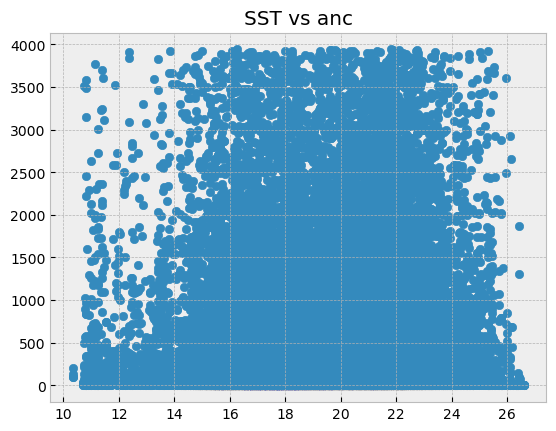

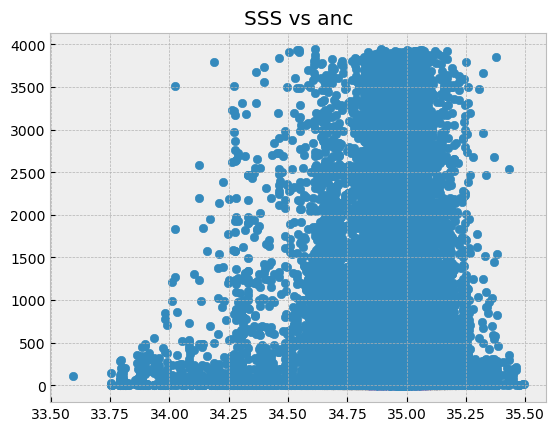

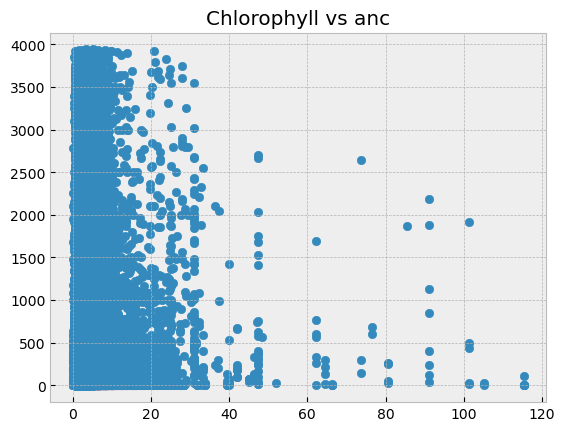

In [32]:
plt.scatter(df.oxi,var95No0)
plt.title("Oxygen vs "+myvar)
plt.show()
plt.scatter(df.oxiP,var95No0)
plt.title("Depth of the oxycline vs "+myvar)
plt.show()
plt.scatter(df.shelf,var95No0)
plt.title("Distance from shelf vs "+myvar)
plt.show()
plt.scatter(df.dc,var95No0)
plt.title("Distance from the coast vs "+myvar)
plt.show()
plt.scatter(df.prof,var95No0)
plt.title("Depth vs "+myvar)
plt.show()
plt.scatter(df.sst,var95No0)
plt.title("SST vs "+myvar)
plt.show()
plt.scatter(df.sss,var95No0)
plt.title("SSS vs "+myvar)
plt.show()
plt.scatter(df.chl,var95No0)
plt.title("Chlorophyll vs "+myvar)
plt.show()

Correlations between different species

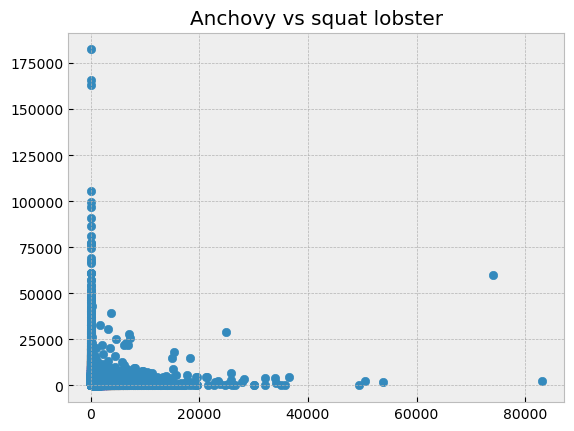

In [34]:
plt.scatter(df.mun,df.anc)
plt.title("Anchovy vs squat lobster")
plt.show()

### Regression

Now let's try to predict absolute values with a regression. For now I'll just focus on one species.

#### Preporcessing

In [46]:
print(df.columns)

# Environmental variables
print(df.columns[6:14])

# Response variable
print(df["anc"].shape)

# Remove outliers
newvar = df[myvar].mask(df[myvar] == 0)
q95 = newvar.quantile(q=0.95)

# Put NaNs where values are larger than q95
var95 = df.mask(df[myvar] > q95)
df[myvar][df[myvar] > q95] = np.nan

# Pick the response variable
exec("y0 = df."+myvar)
y0 = df[myvar]

# Pick the predictors
x0 = df.iloc[:,6:14]#[:,6:15]
print(x0)
print(y0)

# Remove nan's
x0["var"] = y0
xnan = x0.dropna()
print(xnan)

# Separate predictor and response variable again
xx = xnan.iloc[:,0:-1]
yy = xnan.iloc[:,-1]
print(yy)

Index(['lon', 'lat', 'year', 'month', 'day', 'time', 'shelf', 'dc', 'prof',
       'sst', 'sss', 'chl', 'oxi', 'oxiP', 'masas', 'anc', 'ancp', 'ancg',
       'sar', 'jur', 'cab', 'mun', 'sam', 'bag', 'fvo', 'pot', 'vin', 'mic',
       'zoo', 'dem', 'mer', 'otr', 'cam', 'unclassified', 'Unnamed: 34',
       'BOOL ANC', 'BOOL SAR', 'AMBAS', 'Unnamed: 38', 'Unnamed: 39'],
      dtype='object')
Index(['shelf', 'dc', 'prof', 'sst', 'sss', 'chl', 'oxi', 'oxiP'], dtype='object')
(307243,)
         shelf      dc         prof  sst  sss  chl  oxi  oxiP
0       80.045  87.929  2805.173340  NaN  NaN  NaN  NaN   NaN
1       76.501  84.342  2354.189209  NaN  NaN  NaN  NaN   NaN
2       73.048  80.847  2016.665283  NaN  NaN  NaN  NaN   NaN
3       58.327  68.787  1689.872314  NaN  NaN  NaN  NaN   NaN
4       54.590  65.034  1416.297729  NaN  NaN  NaN  NaN   NaN
...        ...     ...          ...  ...  ...  ...  ...   ...
307238 -10.283   1.387   115.449669  NaN  NaN  NaN  NaN   NaN
307239 -10.134   

/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2120312188.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[myvar][df[myvar] > q95] = np.nan


In [47]:
# Split the data
x_train, x_test, y_train, y_test = train_test_split(xx,yy, test_size = 0.2)

#### Random forest

In [49]:
# create regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0) # 1000 is much slower and doesn't improve much

In [50]:
# Fit the random forest
fitted = regressor.fit(x_train, y_train)

In [51]:
# Predict some value
y2_train = regressor.predict(x_train)
y2_test = regressor.predict(x_test)

In [52]:
# Check the model

print("\n train: \n")
print("Error sq. train:",metrics.mean_squared_error(y_train, y2_train))
print("R2 train:",metrics.r2_score(y_train, y2_train))

print("\n test: \n")
print("Error sq.:",metrics.mean_squared_error(y_test, y2_test))
print("R2:",metrics.r2_score(y_test, y2_test))


 train: 

Error sq. train: 2146.5898311142355
R2 train: 0.9099895597832586

 test: 

Error sq.: 14429.921436340537
R2: 0.3955651864691989


We get a very high R2 in the train set but a low one in the test set so the model is overfitting.

### Classification

Since the regression provided a very bad R2 and the data is highly biased with lot's of 0's, we then tried to simply predict presence absence to assigning 1 to all values above 0. This I'll work with all species.

#### Data pre-processing

In [69]:
def preProcess(df, myvar, predloc, envars, splitSize, timeCol = 5, tdiff = 0.05):
    
    # Pick the response variable
    exec("y0 = df."+myvar)
    y0 = df[myvar]
    print("\n")
    print(myvar)
    print(y0.mean())
    
    # Pick the predictors but keep the time a lat and lon information
    x0 = df.iloc[:,0:predloc[1]]
    
    # Remove nan's
    x0["var"] = y0
    xnan = x0.dropna()
    print(x0["var"].mean())
    
    # Drop duplicate measurements
    xnanUnique = xnan.drop_duplicates(subset = envars)
    
    # Separate predictor and response variable again
    xx = xnanUnique.drop("var", axis = 1)
    xx = np.array(xx)
    yy = xnanUnique["var"]
    print(yy.mean())
    
    # Print the ranges of the environmental variables
    envMin = []
    envMax = []
    for i in range(predloc[0],predloc[1]):
        envMin.append(xx[:,i].min())
        envMax.append(xx[:,i].max())
        print("min "+envars[i-predloc[0]]+": "+str(xx[:,i].min()))
        print("max "+envars[i-predloc[0]]+": "+str(xx[:,i].max()))
    
    # Change all y values to 1 to get a presence-absence model
    yy[yy>0] = 1
    print(yy.mean())
    
    # Group cruises per time
    # Change the time column to a constant time per cruise (here's we'll guess the number of cruises and the time intervals)
    # First group by times where the difference between every single time and their average is not greater than tidff
    xt = np.array(xx[:,timeCol])
    mask = np.abs(xt[:-1] - xt[1:]) <= tdiff
    xtime = np.split(xt, np.where(~mask)[0] + 1)
    # Now get the averages
    xav = []
    for i in range(0,len(xtime)):
        xav.append(xtime[i].mean())
    # Now substitute the time column values
    for i in range(0,len(xav)):
        for j in np.unique(xtime[i][:]):
            xt[xt==j] = xav[i]
    xx[:,timeCol] = xt
    
    # Split train and test datasets
    x_train, x_test, y_train, y_test = train_test_split(xx,yy, test_size = splitSize)
    
    return x_train, x_test, y_train, y_test, xx, yy, envMin, envMax

In [70]:
# Load the variables for all species

x_trains = list()
x_tests = list()
y_trains = list()
y_tests = list()
xxs = list()
yys = list()
envMins = list()
envMaxs = list()
means = list()

for i in range(0,len(myvars)):
    x_train, x_test, y_train, y_test, xx, yy, envMin, envMax = preProcess(df = df, myvar = myvars[i], predloc = predloc, envars = envars, splitSize = splitSize)
    x_trains.append(x_train)
    x_tests.append(x_test)
    y_trains.append(y_train)
    y_tests.append(y_test)
    xxs.append(xx)
    yys.append(yy)
    envMins.append(envMin)
    envMaxs.append(envMax)
    means.append(yy.mean())



anc
44.46261196897767
44.46261196897767
40.488753117623304
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 31.3293151855469
min sss: 33.0674667358398
max sss: 35.6356887817383
min chl: 0.0301486998796463
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 153.021484375
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.21410203661797983


sar
8.92181965583014


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1


8.92181965583014
9.660237203223126
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 31.3293151855469
min sss: 33.0674667358398
max sss: 35.6356887817383
min chl: 0.0301486998796463
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 153.021484375
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.061720437190350946


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




jur
17.263733325127788
17.263733325127788
19.863879345444577
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 31.3293151855469
min sss: 33.0674667358398
max sss: 35.6356887817383
min chl: 0.0301486998796463
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 153.021484375
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.11861301486055506


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




cab
8.19725913402116
8.19725913402116
8.434649549770871
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 31.3293151855469
min sss: 33.0674667358398
max sss: 35.6356887817383
min chl: 0.0301486998796463
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 153.021484375
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.09593992445319038


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




mun
75.83435491412024
75.83435491412024
70.35884466801062
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.11148345867591473


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




sam
4.568160500522986
4.568160500522986
2.1008184873607587
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.0063118932432871195


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




bag
9.740594524656863
9.740594524656863
8.86066625263307
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.030131044066651947


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




fvo
3.7939064300266367
3.7939064300266367
4.149039343509893
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 11.2996520996094
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.0435791015625
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.008212678818643286


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




pot
21.19507124224947
21.19507124224947
29.17149226294662
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.1726757712377923


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




vin
423.4221322497189
423.4221322497189
132.14472477527653
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.041534423828125
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.22660533407675867


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




mic
105.98065923379102
105.98065923379102
147.2599702858605
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 26.9859619140625
min sss: 33.6783447265625
max sss: 35.4145469665527
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 6.39184522628784
max oxi: 117.88402557373
min oxiP: 0.661929786205292
max oxiP: 163.645401000977
0.09633084996674923


zoo
239.72865421538864


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/

239.72865421538864
11.575477936239077
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 11.2996520996094
max sst: 26.9859619140625
min sss: 33.6783447265625
max sss: 35.4145469665527
min chl: 0.0435791015625
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.661929786205292
max oxiP: 163.645401000977
0.05693884627053266


dem
13.001330255700177
13.001330255700177
18.490443850625265
min shelf: -105.444
max shelf: 528.915
min dc: 0.085
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.814453125
min sst: 10.2901000976562
max sst: 26.0917358398438
min sss: 34.4831085205078
max sss: 35.2780303955078
min chl: 0.030578626319766
max chl: 29.69775390625
min oxi: 20.6284885406494
max oxi: 117.88402557373
min oxiP: 0.743669092655182
max oxiP: 155.223602294922
0.012800735221715298


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/



mer
3.677926494591251
3.677926494591251
0.09628060200892856
min shelf: -100.408
max shelf: 528.915
min dc: 0.085
max dc: 539.894
min prof: 50.2187232971191
max prof: 4999.5751953125
min sst: 13.7083435058594
max sst: 24.2602233886719
min sss: 34.4831085205078
max sss: 35.2780303955078
min chl: 0.0911097303032875
max chl: 29.69775390625
min oxi: 40.0373497009277
max oxi: 117.88402557373
min oxiP: 1.88872802257538
max oxiP: 155.223602294922
0.0017857142857142857


cam
2.0618881856859526
2.0618881856859526
0.6757946788942114
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4145469665527
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.004168106866193603


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_7187/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1


#### Random forest

In [54]:
# Run a random forest for all species.

n_estimators = 100
RFs = list()
predictions = list()
accuracies = list()

print("Accuracy: \n")

for i in range(0,len(myvars)):
    
    if balanced == 0:
        rf = RandomForestClassifier(n_estimators = n_estimators, random_state = 42)
    elif balanced == 1:
        rf = BalancedRandomForestClassifier(n_estimators = n_estimators)
    rf.fit(x_trains[i][:,predloc[0]:-1],y_trains[i]) # Exclude lat, lon and dates from x_trains
    pred = rf.predict(x_tests[i][:,predloc[0]:-1])
    acc = metrics.accuracy_score(y_tests[i], pred)
    
    RFs.append(rf)
    predictions.append(pred)
    accuracies.append(acc)
    
    print(myvars[i]," ",acc,"\n")

Accuracy: 

anc   0.9522754003437981 

sar   0.9762868165992283 

jur   0.9604632226544829 

cab   0.9685153352031123 

mun   0.9808416677490583 

sam   0.9981168831168831 

bag   0.9933116883116883 

fvo   0.9981974187035836 

pot   0.9713459516298633 

vin   0.9680738085756007 

mic   0.9891094834232845 

zoo   0.9945828819068255 

dem   0.9967180833606827 

mer   0.9985119047619048 

cam   0.9988478481870552 



The accuracy is generally very good.

In [26]:
#| eval: true

datInfo = pd.DataFrame(data = [], index = myvars, columns = ["Species"])
datInfo["Averages"] = means
datInfo["Accuracy"] = accuracies

Anchovy
0.23959648051389926 

[0.15619579 0.12437227 0.14925903 0.13717448 0.139891   0.15330191
 0.13980551]
Sardine
0.061720437190350946 

[0.11984066 0.12495438 0.1148071  0.16663356 0.16963191 0.14283456
 0.16129783]
Jack mackerel
0.11861301486055506 

[0.11716192 0.12743649 0.1113191  0.17453453 0.16443918 0.14527509
 0.15983368]
Chub mackerel
0.09593992445319038 

[0.12203029 0.13036087 0.11203692 0.16241573 0.17002463 0.14498441
 0.15814716]
Squat lobster
0.11148345867591473 

[0.14842806 0.14403989 0.16173711 0.13912843 0.13858177 0.12332849
 0.14475626]
White anchovy
0.0063118932432871195 

[0.12631974 0.17008843 0.11024799 0.14724798 0.14969891 0.13808148
 0.15831547]
Cat fish
0.030131044066651947 

[0.15210073 0.12650866 0.13238915 0.13504529 0.16066333 0.13269173
 0.16060111]
False flying fish
0.008212678818643286 

[0.12205188 0.11903935 0.10390866 0.1701774  0.17327754 0.14144996
 0.17009521]
Humboldt squid
0.1726757712377923 

[0.12774675 0.12406551 0.13472335 0.15212196

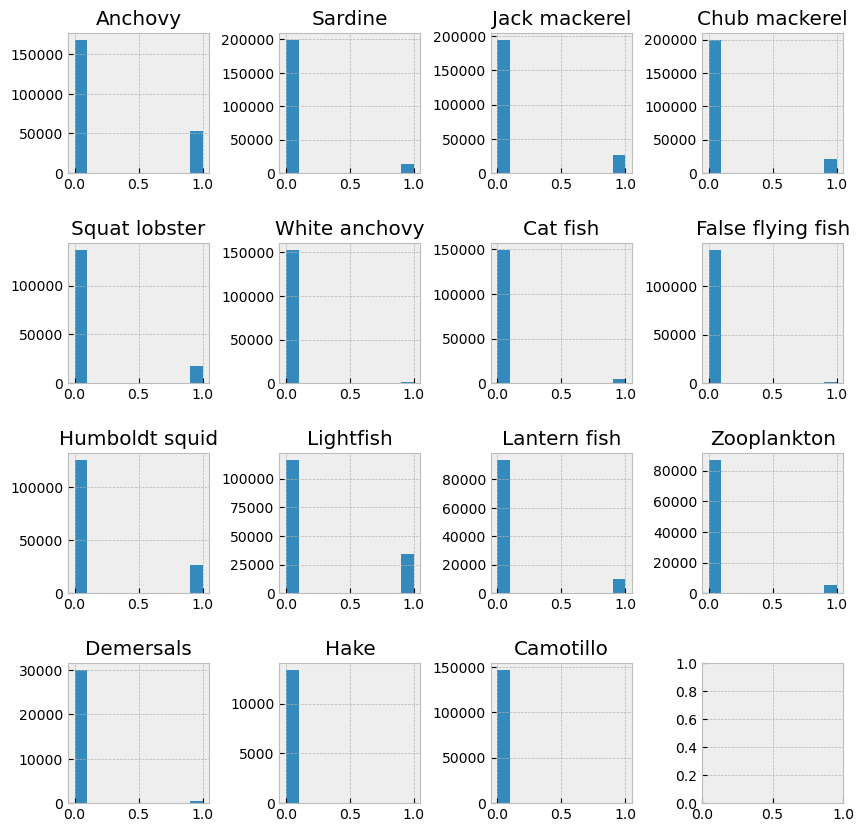

In [29]:
#| eval: true

# Plotting data distribution

fig, axs = plt.subplots(4,4, figsize=(10, 10))
fig.subplots_adjust(hspace = .5, wspace = 0.5)#, wspace=.001)

axs = axs.ravel()

for i in range(0,len(myvars)):
    print(spNames[i])
    print(yys[i].mean(),"\n")
    print(RFs[i].feature_importances_)
    axs[i].hist(yys[i])
    axs[i].set_title(spNames[i])
#    axs[i].tick_params('y', labelleft=False)
#    if i == 0 or i == 4 or i == 8:
#        axs[i].tick_params('y', labelleft=True)

### 2D plots fo the cruises

#### Grouping data per cruise to plot the predictions

In [55]:
# Function to separate the data by cruise

def cruises_separation(xx,yy):
    cruises_x = list()
    cruises_y = list()
    for i in np.unique(xx[:,timeCol]):
        cruises_x.append(xx[xx[:,timeCol] == i , :])
        cruises_y.append(yy[xx[:,timeCol] == i])
    return cruises_x, cruises_y

In [56]:
cruises_xxs = list()
cruises_yys = list()
cruises_x_trains = list()
cruises_y_trains = list()
cruises_x_tests = list()
cruises_y_tests = list()
cruises_predictions = list()

for i in range(0,len(xxs)):
    cx, cy = cruises_separation(xxs[i], yys[i])
    cruises_xxs.append(cx)
    cruises_yys.append(cy)
    cx, cy = cruises_separation(x_trains[i], y_trains[i])
    cruises_x_trains.append(cx)
    cruises_y_trains.append(cy)
    cx, cy = cruises_separation(x_tests[i], y_tests[i])
    cruises_x_tests.append(cx)
    cruises_y_tests.append(cy)
    cx, cy = cruises_separation(x_tests[i], predictions[i])
    cruises_predictions.append(cy)

In [57]:
len(cruises_y_tests[0])
cruises_x_tests[0][0][:,0] # [Species][Cruise][all rows, column] In this case column = 0 has the longitude

array([-76.5, -79.5, -77.4, -75.8, -81.3, -79.2, -72.6, -76.8, -81.8,
       -78.7, -80.5, -77. , -72. , -81.4, -76.8, -81.8, -76.2, -77. ,
       -80.1, -80.1, -72.3, -79.8, -79.3, -77. , -80.3, -74. , -78.2,
       -73.2, -72.5, -77.9, -79.5, -73.2, -78.3, -78.5, -81.5, -71.6,
       -79.3, -71.6, -77.7, -76.6, -78.4, -74.8, -82.5, -79.4, -78. ,
       -81.5, -75.2, -77.9, -81.6, -78.3, -72.2, -77.3, -72.6, -72.7,
       -76.6, -77.7, -81.8, -78.4, -75.5, -77.6, -76.6, -79.2, -78.9,
       -79.8, -76.5, -78.8, -76.2, -79.6, -80.8, -79.3, -78.8, -77.3,
       -76.6])

#### Plotting the distribution maps of species presence-absence

In [59]:
# Plotting function

nams = ["all", "train", "test", "predictions"]

def plotMaps(x, y, mainTitle, names = spNames, colMap = y_cm, axLims = axLims):
    
    for j in range(0,len(spNames)):
        
        fig, axs = plt.subplots(11,5, figsize=(15, 30))
        fig.suptitle(names[j]+" "+mainTitle, y=0.9)
        fig.subplots_adjust(hspace = .5, wspace = 0.5)#, wspace=.001)
        
        axs = axs.ravel()
        
        for i in range(0,len(x[j])):
            axs[i].scatter(x[j][i][:,0], x[j][i][:,1], s=1, c = y[j][i][:,],cmap=colMap)
            axs[i].set_title(np.around(x[j][i][0,5],2))
            axs[i].set_xlim(axLims[0:2])
            axs[i].set_ylim(axLims[2:])
            
        plt.show()

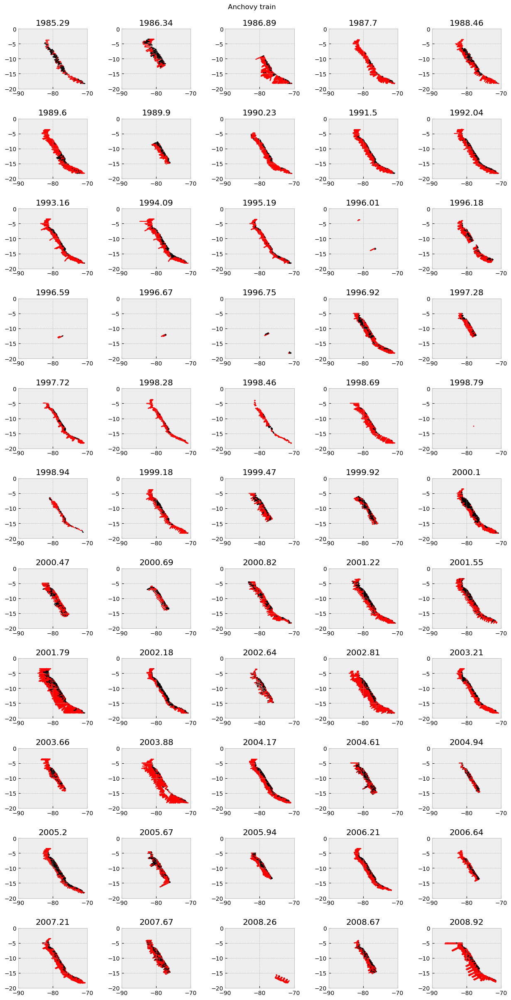

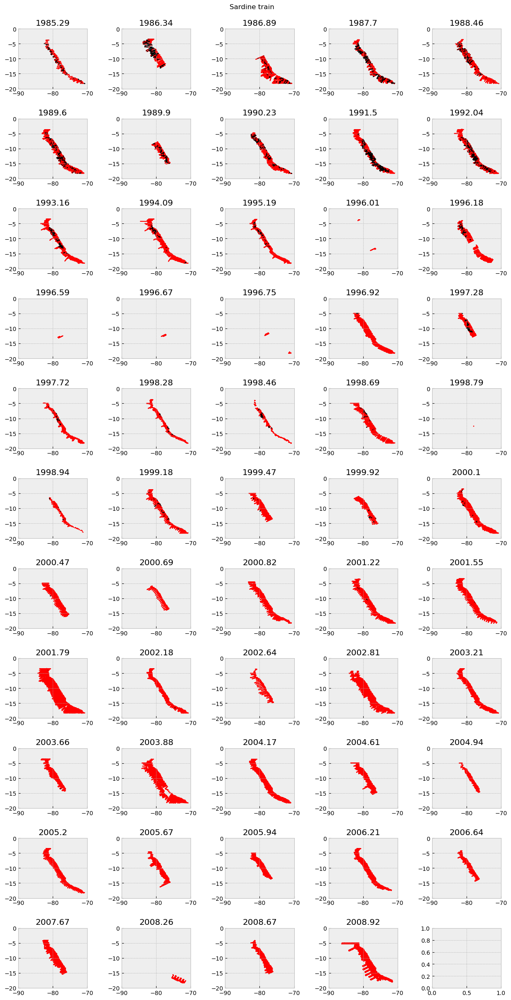

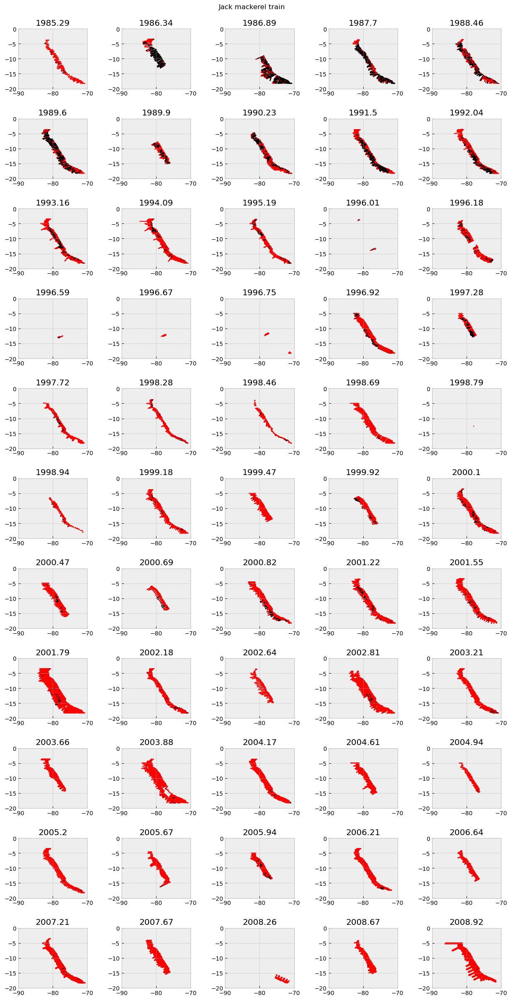

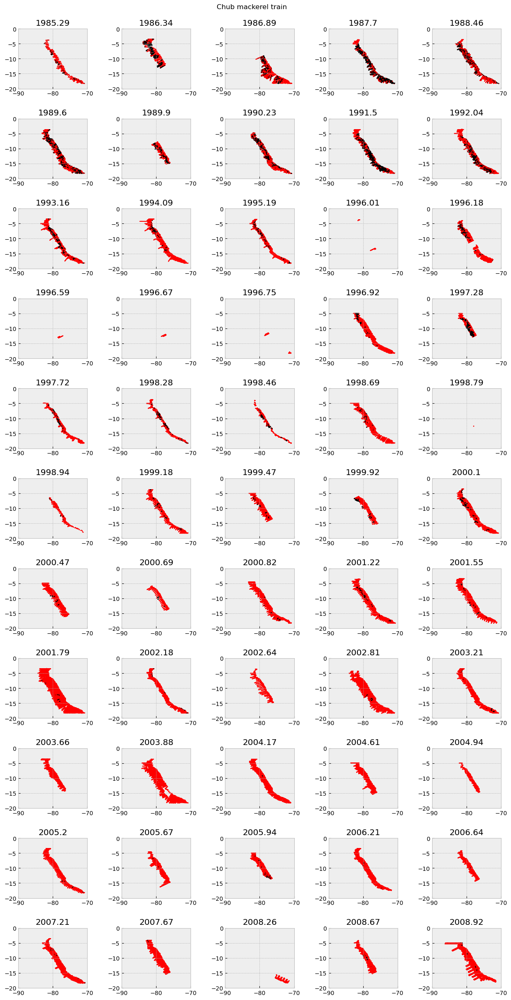

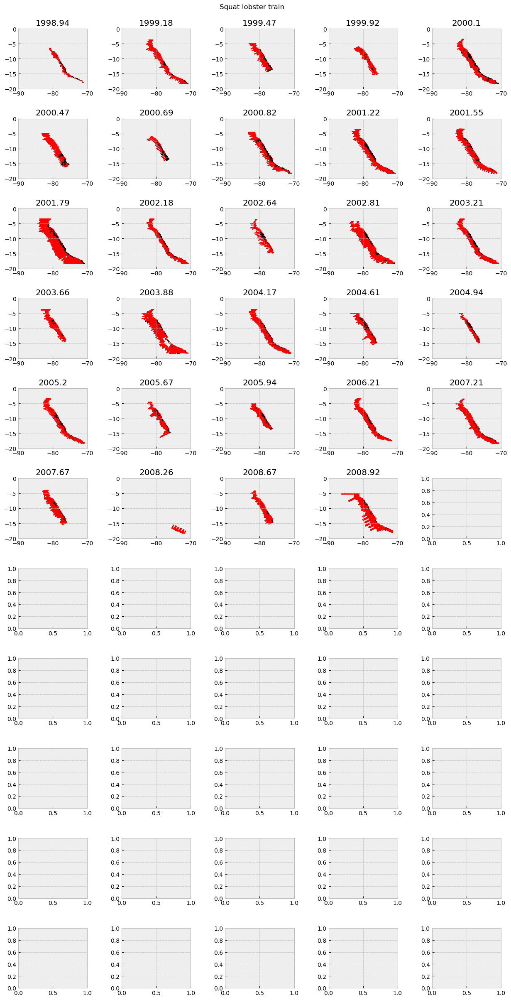

...

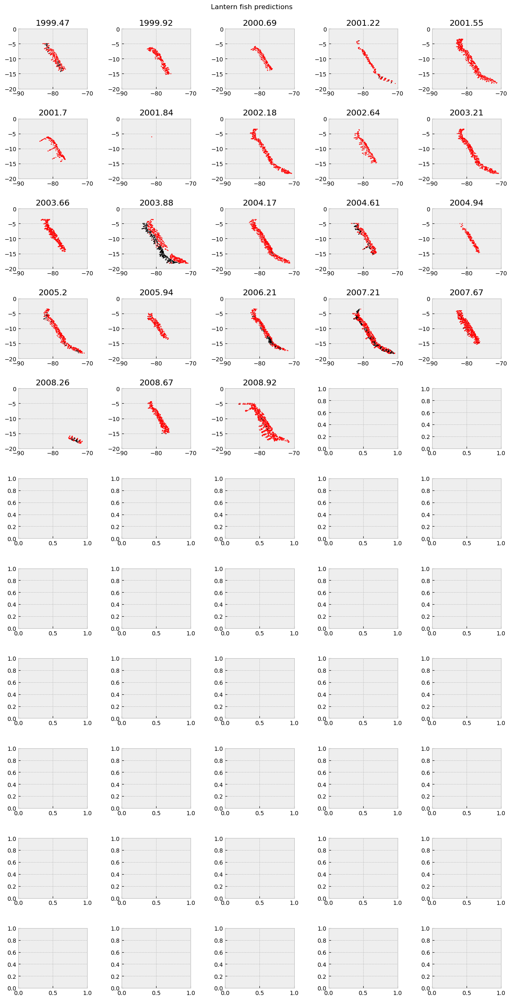

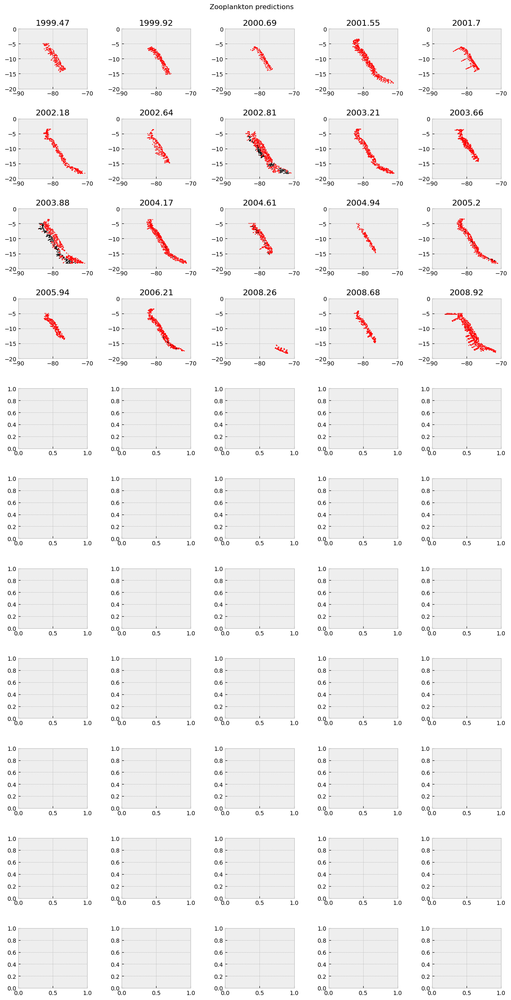

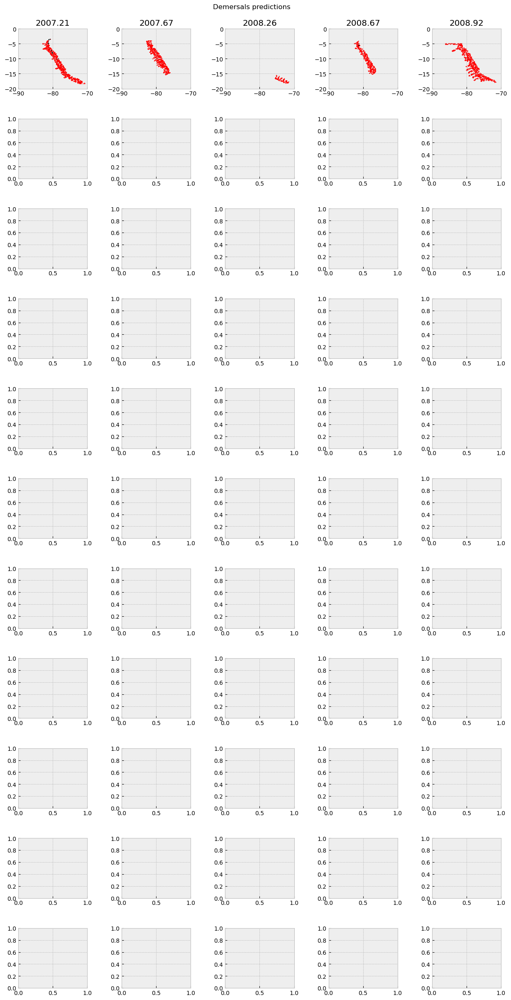

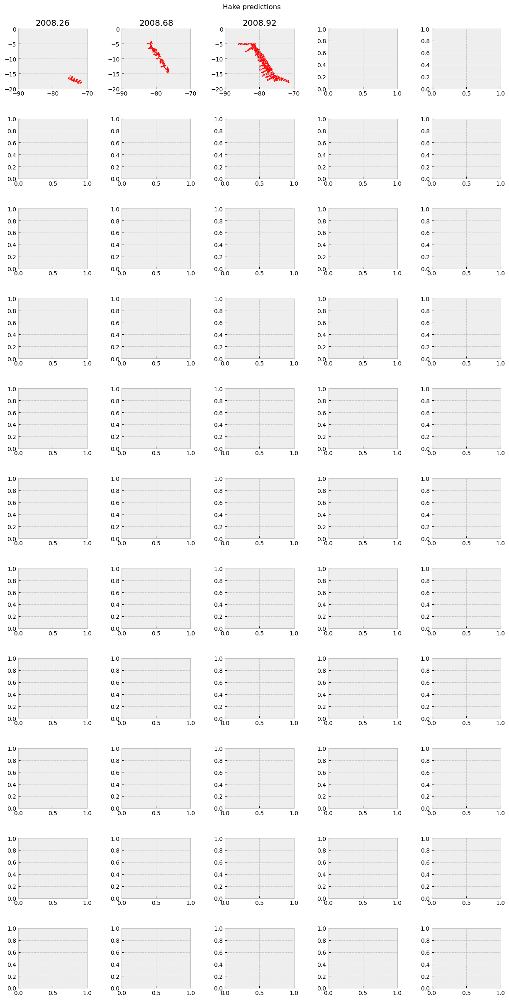

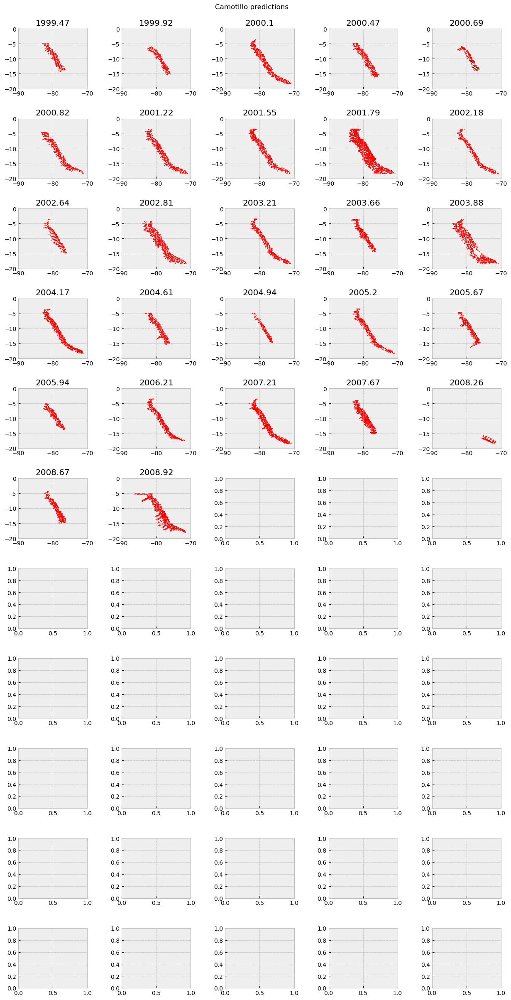

In [60]:
# Species presence-absence

#plotMaps(cruises_xxs, cruises_yys, mainTitle = "all")
plotMaps(cruises_x_trains, cruises_y_trains, mainTitle = "train")
plotMaps(cruises_x_tests, cruises_y_tests, mainTitle = "test")
plotMaps(cruises_x_tests, cruises_predictions, mainTitle = "predictions")

The presence absence with randomly separated train and test data works very well.

#### Time-series prediction with a random forest classifier

In this part of the project I'll use the first part of the dataset as train and the second part as test to get an actual time-series prediction.

Note: This part of the script is not working after cleaning up so I'll have to fix it later on.

In [64]:
# A stupid way to guess where to cut the data
# But it works hehe
print(xx.shape)
print(xx[:,2])
print(xx[20000,5])
print(xx[90000,5])
print(xx[53500,5]) # Split here to be able to predict El Niño
print(xx[157000,5]) # And here to get more train values
print(xx[220000,5])
print(yy.shape)

(217135, 8)


InvalidIndexError: (slice(None, None, None), 2)

In [65]:
splitSpot = 157000 #53500
xTrain = xx[0:splitSpot,:]
xTest = xx[splitSpot:-1,:]
yTrain = yy[0:splitSpot]
yTest = yy[splitSpot:-1]

print(xTrain)
print(xTest)
print(yTrain)
print(yTest)

InvalidIndexError: (slice(0, 157000, None), slice(None, None, None))

In [66]:
# Initialise
rf_timeseries = RandomForestClassifier(n_estimators = 100, random_state = 0)

# Fit
rf_timeseries.fit(xTrain,yTrain)

NameError: name 'xTrain' is not defined

In [67]:
# Predict values
yPred = rf_timeseries.predict(xTest)
rf_timeseries_acc = metrics.accuracy_score(yTest, yPred)
print(rf_timeseries_acc)

NameError: name 'xTest' is not defined

## Conclusion

The regressor random forest is not able to predict fish abundances.
The calassification random forest can predict presence and absence of fish with a good precision. However, this is because the test and train data are very similar. Once test and train data are separated as different sections of the timeseries, the accuracy of the RF decreases a lot :(